In [188]:
import astropy
import numpy as np
import matplotlib
import pandas as pd
import scipy

from astropy.io import fits
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter 

In [48]:
plt.rcParams['figure.figsize'] = (12, 9)

In [49]:
file = fits.open('/Users/FRANNYPACK/Downloads/grind!/research/Data/LMC_30Dor_fg/the actual cube!.fits')

In [50]:
FUSE = pd.read_csv('/Users/FRANNYPACK/Downloads/grind!/research/Data/FUSE_info (SMC + LMC).csv')
FUSE = FUSE[(FUSE["DEC_FK5"] < -67.5) & (FUSE["RA_FK5"] > 75)] # relevant stars in LMC

In [51]:
len(FUSE)

58

In [52]:
FUSE

,Target,RA_FK5,DEC_FK5,Galaxy,SpecType,FUSE_ID,Short_ID,log10_N_MW
0,Sk-69_94,79.560542,-69.250278,LMC,A0e/LBV,Z9050201000,z90502,16.839883
1,HDE269599,82.094500,-69.142281,LMC,B,E9570301000,e95703,17.953637
2,HD38489,85.055833,-69.379500,LMC,B0,E9570501000,e95705,17.985449
4,BI184,82.627500,-71.042022,LMC,B0.5V,P2170301000,p21703,18.155617
6,SK-69D59,75.803292,-69.027000,LMC,B0Ia,P1031103000,p10311,17.800738
7,SK-68D52,76.835833,-68.536000,LMC,B0Ia,P1174001000,p11740,16.831991
8,MACHO79-4779,77.371250,-68.917500,LMC,B0V,C1030301000,c10303,17.522088
9,MACHO78-6097,79.519583,-69.805278,LMC,B0V,C1030101000,c10301,17.984362
10,HV2274,75.670667,-68.405917,LMC,B1.5III,B0770201000,b07702,17.116283
11,Sk-69-237,84.505625,-69.370472,LMC,B1Ia,B1280701000,b12807,17.514136


# MANIPULATING ANGULAR DISTANCE VALUES

In [53]:
# returns RA and DEC difference between every H2 sightline pair

def permute(data):
    
    # base case
    if len(data) == 0:
        return [], [], []
    
    # RA and DEC values of the current star being investigated
    cur_RA = data.iloc[0]['RA_FK5']
    cur_DEC = data.iloc[0]['DEC_FK5']
    cur_star = data.iloc[0]['Target']
    data = data.iloc[1:] 

    RA, DEC, star = [], [], [] # corresponding RA, DEC values and stars for each sightline-to-sightline pair
    
    for i in range(len(data)):
        RA.append(np.abs(cur_RA - data.iloc[i]['RA_FK5']))
        DEC.append(np.abs(cur_DEC - data.iloc[i]['DEC_FK5']))
        star.append([cur_star, data.iloc[i]['Target']])
    
    recurse_RA, recurse_DEC, recurse_star = permute(data)
    if len(recurse_RA) != 0: 
        RA += recurse_RA
        DEC += recurse_DEC
        star += recurse_star
    
    return RA, DEC, star

In [54]:
data = FUSE # copy of FUSE we can play w/h
RA, DEC, star = permute(data)
RA, DEC = np.array(np.radians(RA)), np.array(np.radians(DEC)) # must be in radians

In [55]:
file[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 3191                                                  
NAXIS2  =                 2681                                                  
NAXIS3  =                  301                                                  
BLANK   =                   -1  /                                               
BUNIT   = 'K       '                                                            
DATE-OBS= '2021-10-27T16:16:57.5'  /                                            
TELESCOP= 'ASKAP   '  /                                                         
CRPIX1  =    1.70200000000E+03  /                                               
CDELT1  =   -1.94444444444E-03  /                                               
CRVAL1  =    8.32511958333E+

In [56]:
# normalization factor from image space to k-space = (2 * pi) / delta RA
# denominator = delta RA = number pixels (since trying to move to pixel space)

k_minX = (2 * np.pi) / 3191
k_minY = (2 * np.pi) / 2681

In [57]:
# before fftshifting
k_x = RA * (2 * np.pi / k_minX)
k_y = DEC * (2 * np.pi / k_minY)

# after fftshifting
k_x = (3191/2) - k_x
k_y = (2681/2) - k_y

# THE PLOTS

GOAL: see which H2 sightline pairs we may potentially remove, if they are too entrenched in the noise of the data

In [69]:
# masking low frequency data

def mask(im, radius):
    rows, cols = im.shape
    center_row, center_col = int(rows / 2), int(cols / 2)
    mask = np.ones((rows, cols), np.uint8)
    radius = radius
    center = [center_row, center_col]
    x, y = np.ogrid[:rows, :cols]
    mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= radius * radius
    mask[mask_area] = 0
    im = im * mask 
    
    return im

In [78]:
def fft(im, use_mask = False):
    im[np.where(np.isnan(im))] = 0
    im = np.fft.fftshift(np.fft.fft2(im))
    
    if use_mask:
        im = mask(im, 1)
    
    norm = np.linalg.norm(im)
    im = im / norm
        
    return im

# NORMAL DATA

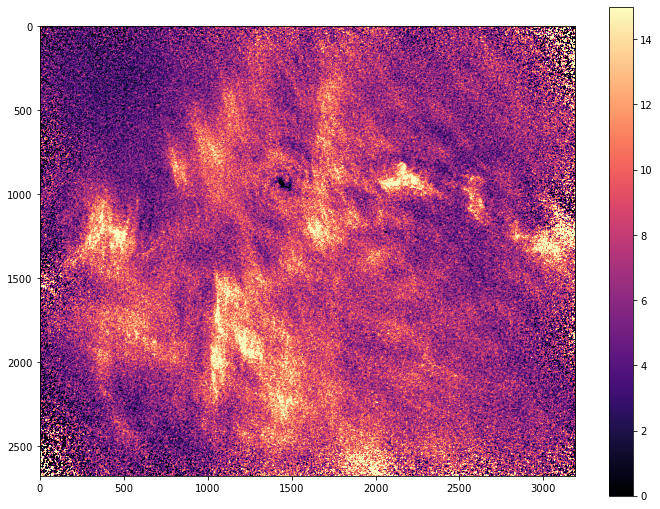

In [15]:
plt.imshow(np.flip(file[0].data[86,:,:], axis = 0), cmap = 'magma', vmin = 0, vmax = 15)
plt.colorbar()

In [14]:
im = fft(file[0].data[86,:,:])

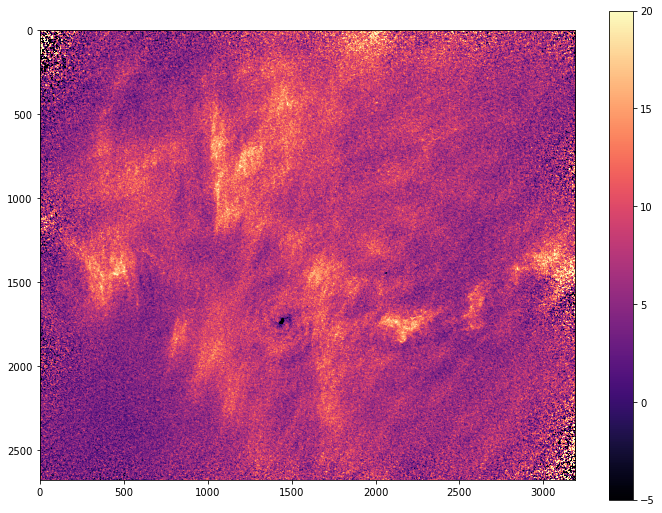

In [63]:
plt.imshow(file[0].data[86,:,:], cmap = 'magma', vmin = -5, vmax = 20)
plt.colorbar()

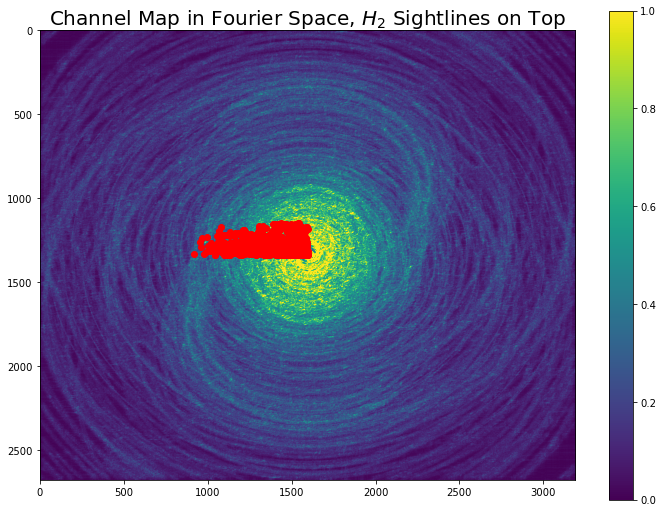

In [58]:
plt.imshow(np.abs(im), vmin = 0.000001, vmax = 0.0007)
plt.scatter(k_x, k_y, c = 'red')
plt.title('Channel Map in Fourier Space, $H_2$ Sightlines on Top', fontsize = 20)
plt.colorbar()

Spiral arms could be sketchy telescopic artifacts b/c spanning multiple angular scales

# REMOVING BORDER NOISE (does this remove the spiral arms?)

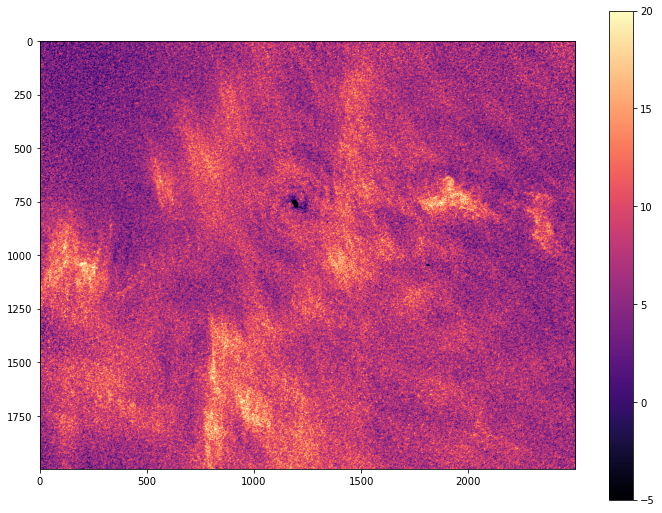

In [68]:
plt.imshow(np.flip(file[0].data[86,500:2500,250:2750], axis = 0), cmap = 'magma', vmin = -5, vmax = 20)
plt.colorbar()

In [128]:
im_nonoise = fft(file[0].data[86,500:2500,250:2750])

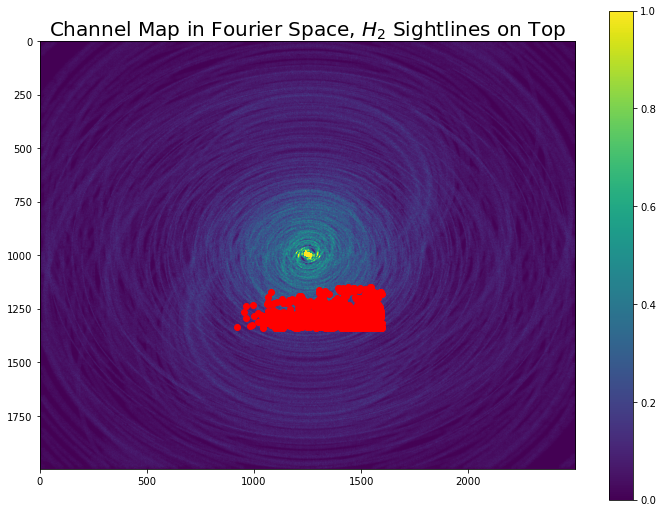

In [129]:
plt.imshow(np.abs(im_nonoise), vmin = 0.000001, vmax = 0.0015)
plt.scatter(k_x, k_y, c = 'red')
plt.title('Channel Map in Fourier Space, $H_2$ Sightlines on Top', fontsize = 20)
plt.colorbar()

Spiral arms still there even if we mask border and low-frequency noise

# USING USM TO CORRESPOND TO SHORTEST BASELINE

In [103]:
# does the actual work of the USM

def process_usm(cc_sum, FWHM = 0.554):
    
    pix_len = file[0].header['CDELT2'] * 60 # ['CDELT2'] = pixel length in deg, multiply by 60 to convert to arcmin
    FWHM30_pix = FWHM / pix_len # want FWHM to be 0.554 arcmin (corresponding to shortest baseline), so convert to pixels
    sigma = FWHM30_pix / (2 * np.sqrt(2 * np.log(2))) # converts from FWHM to sigma, since Gaussian filter specified by sigma
    sum_smooth = gaussian_filter(cc_sum, sigma = sigma) # does smoothing using Gaussian filter
    
    sum_USM = cc_sum - sum_smooth
    
    return sum_USM


In [106]:
# main function

def usm(v_indx, FWHM = 0.554, maskb = False):
    
    file = fits.open('/Users/FRANNYPACK/Downloads/grind!/research/Data/LMC_30Dor_fg/the actual cube!.fits') # reset
    cc_sum = file[0].data[v_indx, :, :]
    sum_USM = process_usm(cc_sum)
    sum_USM[np.where(sum_USM < 0.)] = 0. # at end so negative noise cancels out with positive noise
    file = fits.open('/Users/FRANNYPACK/Downloads/grind!/research/Data/LMC_30Dor_fg/the actual cube!.fits') # reset
    
    return sum_USM
   

In [109]:
im_usm = usm(86)

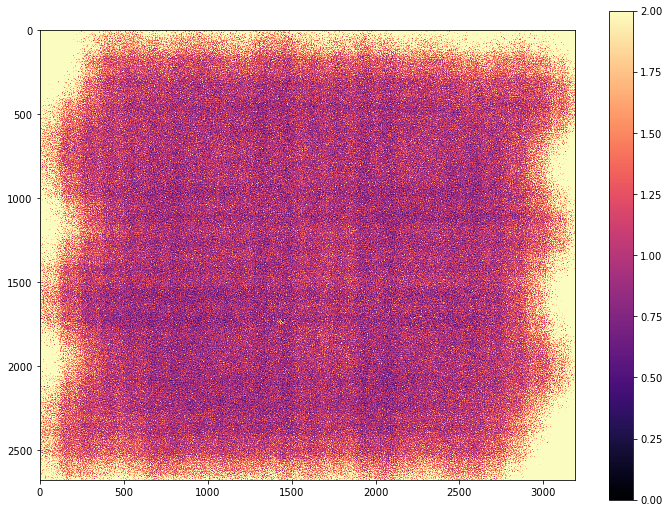

In [190]:
plt.imshow(im_usm, cmap = 'magma', vmax = 2)
plt.colorbar()

Checking whether this is a result of the image being projected onto my computer, or whether this is legit - apparently it is actual ripples in the data!

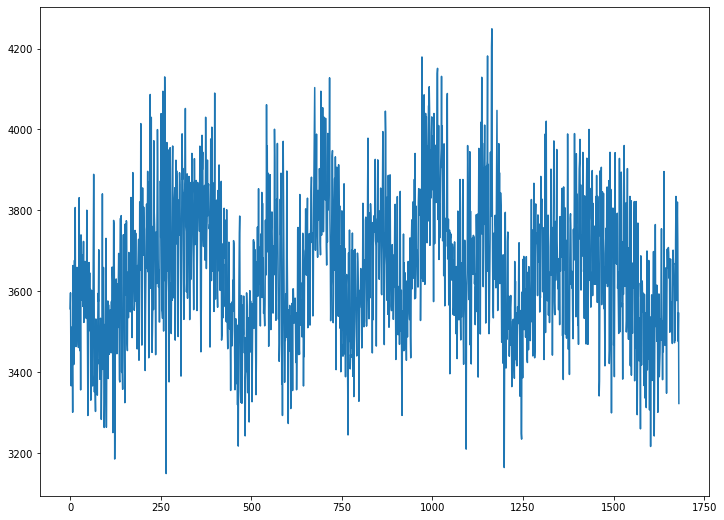

In [186]:
plt.plot(np.sum(im_usm[500:-500,:], axis = 1))

Channel map minus the (^) noise

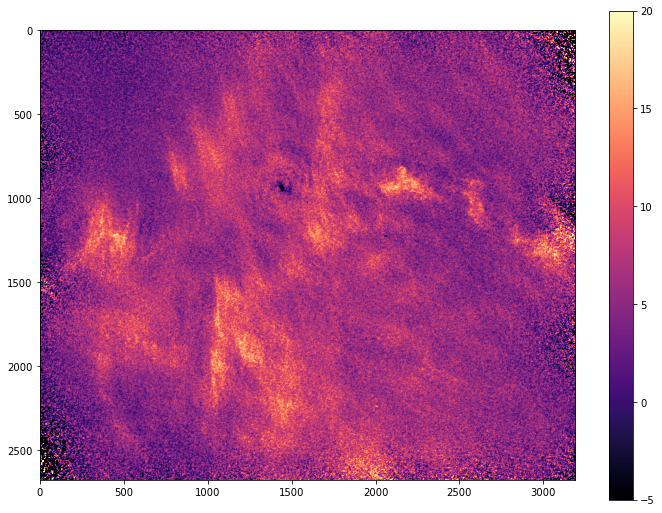

In [152]:
plt.imshow(np.flip((file[0].data[86,:,:] - im_usm), axis = 0), cmap = 'magma', vmin = -5, vmax = 20)
plt.colorbar()

Side-by-side comparison . . . 

Text(0.5, 1.0, 'GASKAP Data w/h Cuts')

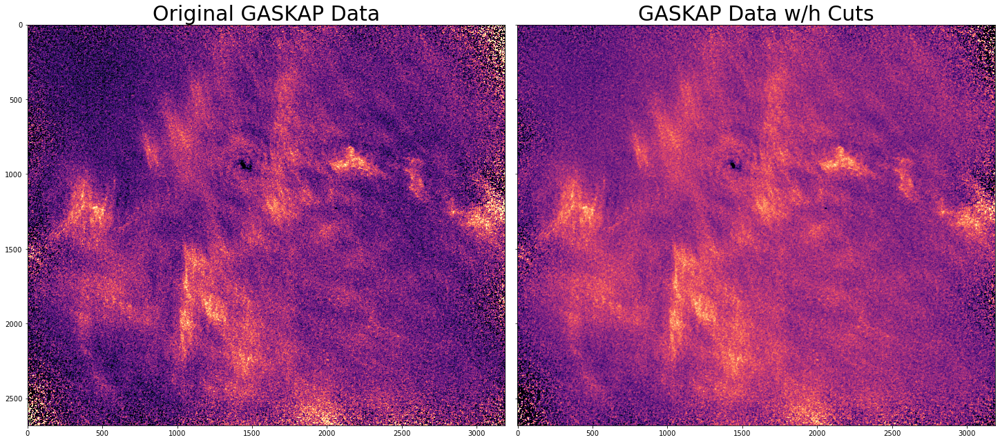

In [154]:
fig, (ax1, ax2) = plt.subplots(1, 2, sharey = True, constrained_layout = True, figsize = (20, 40))
ax1.imshow(np.flip(file[0].data[86,:,:], axis = 0), cmap = 'magma', vmin = 0, vmax = 20)
ax2.imshow(np.flip((file[0].data[86,:,:] - im_usm), axis = 0), cmap = 'magma', vmin = -5, vmax = 20)
ax1.set_title('Original GASKAP Data', fontsize = 30)
ax2.set_title('GASKAP Data w/h Cuts', fontsize = 30)

In [116]:
im_usm_fft = fft(im_usm)

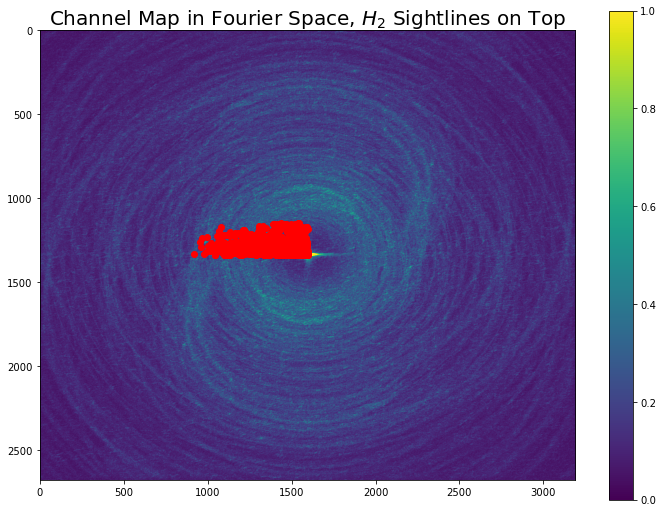

In [117]:
plt.imshow(np.abs(im_usm_fft), vmin = 0.000001, vmax = 0.0015)
plt.scatter(k_x, k_y, c = 'red')
plt.title('Channel Map in Fourier Space, $H_2$ Sightlines on Top', fontsize = 20)
plt.colorbar()

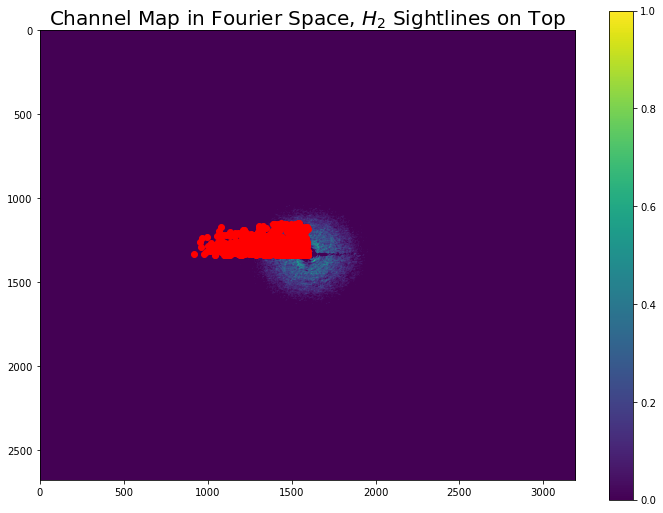

In [124]:
plt.imshow(np.abs(im) - np.abs(im_usm_fft), vmin = 0.000005, vmax = 0.0015)
plt.scatter(k_x, k_y, c = 'red')
plt.title('Channel Map in Fourier Space, $H_2$ Sightlines on Top', fontsize = 20)
plt.colorbar()

Zooming in...

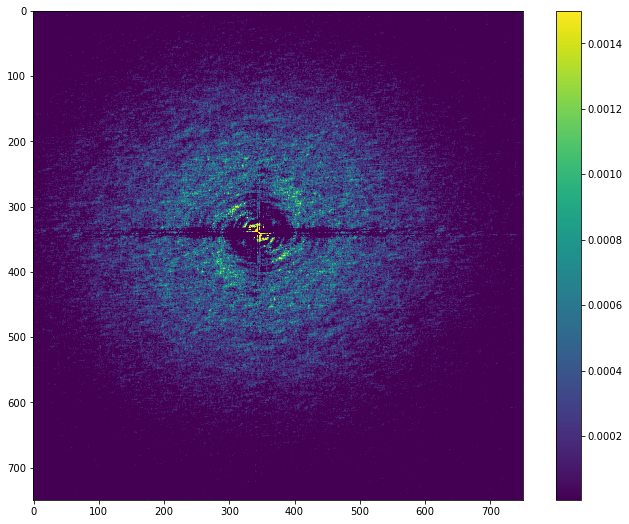

In [130]:
plt.imshow((np.abs(im) - np.abs(im_usm_fft))[1000:1750, 1250:2000], vmin = 0.000005, vmax = 0.0015)
plt.colorbar()

Spiral arms, and lots of other noise, have disappeared!

Trying same thing w/h image w/o border noise . . .

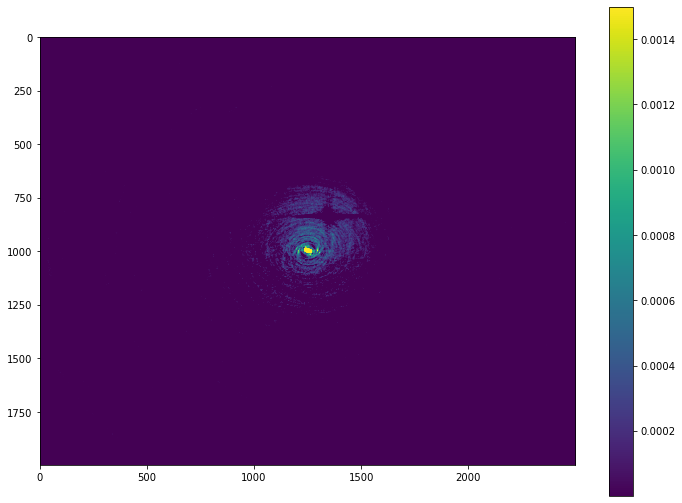

In [131]:
plt.imshow(np.abs(im_nonoise) - np.abs(im_usm_fft[500:2500,250:2750]), vmin = 0.000001, vmax = 0.0015)
plt.colorbar()

Zooming in . . . 

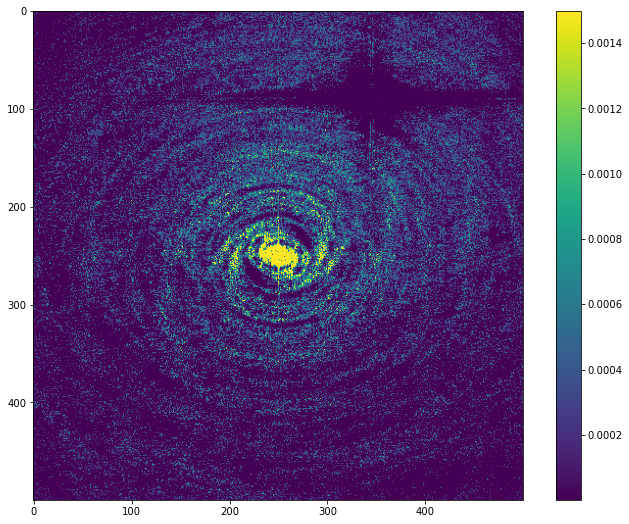

In [132]:
plt.imshow((np.abs(im_nonoise) - np.abs(im_usm_fft[500:2500,250:2750]))[750:1250, 1000:1500], vmin = 0.000001, vmax = 0.0015)
plt.colorbar()

# USING HI4PI DATA

In [84]:
HI4PI = fits.open('/Users/FRANNYPACK/Downloads/grind!/research/Data/LMC_HI4PI/mosaic_cube.fits')

In [85]:
# FOR HI4PI

def v_indx(v_val): # v_val must be in m/s
    return int((v_val - -51220.42315311206) / (1288.21496912415))

In [86]:
v_indx(9.41 * 10 ** 3)

47

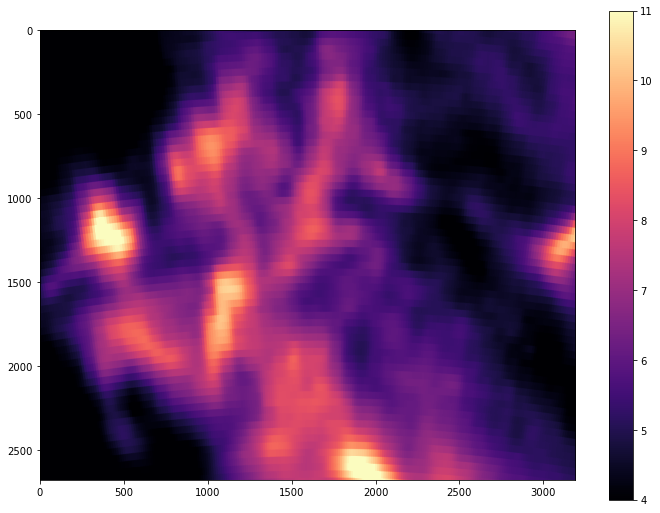

In [100]:
plt.imshow(np.flip(HI4PI[0].data[47,:,:], axis = 0), cmap = 'magma', vmin = 4, vmax = 11)
plt.colorbar()

In [92]:
im_HI4PI = fft(HI4PI[0].data[47,:,:])

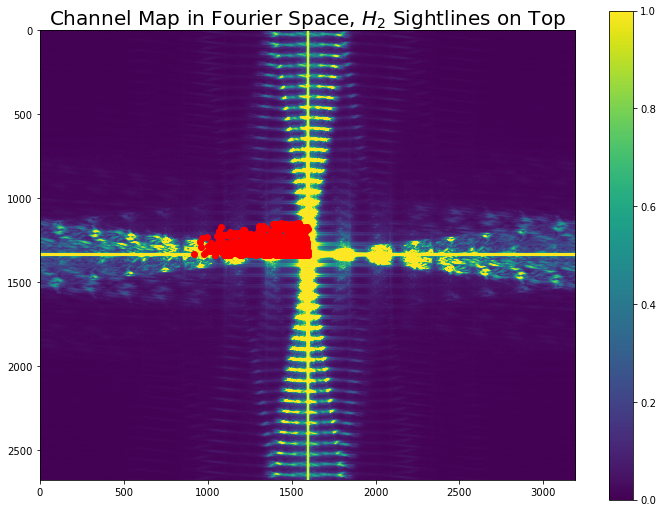

In [102]:
plt.imshow(np.abs(im_HI4PI), vmax = 0.000005)
plt.scatter(k_x, k_y, c = 'red')
plt.title('Channel Map in Fourier Space, $H_2$ Sightlines on Top', fontsize = 20)
plt.colorbar()

So the spiral arms are definitely some sort of GASKAP-y artifact